# Brain Tumor Classification

In [ ]:
import os

os.environ['KAGGLE_CONFIG_DIR'] = '/content/'

In [ ]:
! chmod 600 /content/kaggle.json

In [ ]:
! kaggle datasets download -d sartajbhuvaji/brain-tumor-classification-mri

 96% 83.0M/86.8M [00:00<00:00, 144MB/s]
100% 86.8M/86.8M [00:00<00:00, 129MB/s]


In [ ]:
import zipfile


zip_file_path = "/content/brain-tumor-classification-mri.zip"
extracted_dir = "/content/brain-tumor-classification-mri"


with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

print("Dataset has been extracted to:", extracted_dir)


Dataset has been extracted to: /content/brain-tumor-classification-mri


## Import necessary Libraries

In [ ]:
!pip install --upgrade scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 80.2 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [ ]:
!pip install livelossplot

In [ ]:
import os
import random
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
from IPython.display import Image
import imutils
from shutil import copyfile

from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import keras
import tensorflow.keras as K
from tensorflow.keras.layers import Dropout, Dense
from tensorflow.keras.models import Model
from livelossplot.inputs.keras import PlotLossesCallback


import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, array_to_img, img_to_array
from tensorflow.keras.applications import EfficientNetB1
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import imutils

## Creating Directories to store Cropped Images

In [ ]:
#create directory for training data
os.mkdir('/content/Crop-Brain-MRI')
os.mkdir('/content/Crop-Brain-MRI/glioma_tumor')
os.mkdir('/content/Crop-Brain-MRI/meningioma_tumor')
os.mkdir('/content/Crop-Brain-MRI/pituitary_tumor')
os.mkdir('/content/Crop-Brain-MRI/no_tumor')

In [ ]:
#create directory for testing data
os.mkdir('/content/Test-Data')
os.mkdir('/content/Test-Data/glioma_tumor')
os.mkdir('/content/Test-Data/meningioma_tumor')
os.mkdir('/content/Test-Data/pituitary_tumor')
os.mkdir('/content/Test-Data/no_tumor')

In [ ]:
#specify directory
train_dir = '/content/brain-tumor-classification-mri/Training'
test_dir = '/content/brain-tumor-classification-mri/Testing'

In [ ]:
combined_dir = '/content/combined_data'
shuffled_dir = '/content/shuffled_data'
train_combined_dir = '/content/train_combined_data'
test_combined_dir = '/content/test_combined_data'

In [ ]:
# Create directories for combined and shuffled data
os.makedirs(combined_dir, exist_ok=True)
os.makedirs(shuffled_dir, exist_ok=True)
os.makedirs(train_combined_dir, exist_ok=True)
os.makedirs(test_combined_dir, exist_ok=True)

# Classes
classes = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']

# Combine images from train and test directories based on classes
for class_name in classes:
    class_train_dir = os.path.join(train_dir, class_name)
    class_test_dir = os.path.join(test_dir, class_name)
    class_combined_dir = os.path.join(combined_dir, class_name)

    os.makedirs(class_combined_dir, exist_ok=True)

    for image_name in os.listdir(class_train_dir):
        copyfile(os.path.join(class_train_dir, image_name), os.path.join(class_combined_dir, image_name))

    for image_name in os.listdir(class_test_dir):
        copyfile(os.path.join(class_test_dir, image_name), os.path.join(class_combined_dir, image_name))

# Shuffle the combined data with a specific random state
random_seed = 42
random.seed(random_seed)

# Split the shuffled data back into train and test directories
for class_name in classes:
    class_combined_dir = os.path.join(combined_dir, class_name)
    class_shuffled_dir = os.path.join(shuffled_dir, class_name)
    class_train_combined_dir = os.path.join(train_combined_dir, class_name)
    class_test_combined_dir = os.path.join(test_combined_dir, class_name)

    os.makedirs(class_shuffled_dir, exist_ok=True)
    os.makedirs(class_train_combined_dir, exist_ok=True)
    os.makedirs(class_test_combined_dir, exist_ok=True)

    all_images = os.listdir(class_combined_dir)
    random.shuffle(all_images)

    # Determine the split indices
    total_images = len(all_images)
    train_split = int(0.8 * total_images)

    # Copy shuffled images to the shuffled directory
    for image_name in all_images:
        source_path = os.path.join(class_combined_dir, image_name)
        target_path = os.path.join(class_shuffled_dir, f"{class_name}_{image_name}")
        copyfile(source_path, target_path)

    # Copy images to train_combined directory
    for image_name in all_images[:train_split]:
        source_path = os.path.join(class_combined_dir, image_name)
        target_path = os.path.join(class_train_combined_dir, f"{class_name}_{image_name}")
        copyfile(source_path, target_path)

    # Copy images to test_combined directory
    for image_name in all_images[train_split:]:
        source_path = os.path.join(class_combined_dir, image_name)
        target_path = os.path.join(class_test_combined_dir, f"{class_name}_{image_name}")
        copyfile(source_path, target_path)

# Display the number of images in the train and test directories
for class_name in classes:
    print(f"Number of images in {class_name} train_combined_dir: {len(os.listdir(os.path.join(train_combined_dir, class_name)))}")
    print(f"Number of images in {class_name} test_combined_dir: {len(os.listdir(os.path.join(test_combined_dir, class_name)))}")

Number of images in glioma_tumor train_combined_dir: 740
Number of images in glioma_tumor test_combined_dir: 186
Number of images in meningioma_tumor train_combined_dir: 749
Number of images in meningioma_tumor test_combined_dir: 188
Number of images in no_tumor train_combined_dir: 316
Number of images in no_tumor test_combined_dir: 80
Number of images in pituitary_tumor train_combined_dir: 720
Number of images in pituitary_tumor test_combined_dir: 181


## Data Visualization

In [ ]:
#create classes
classes = os.listdir('/content/train_combined_data')

In [ ]:
classes

['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']

In [ ]:
files_path_dict = {}

for c in classes:
  files_path_dict[c] = list(map(lambda x: train_dir + '/' + c + '/' + x, os.listdir(train_dir + '/' + c )))

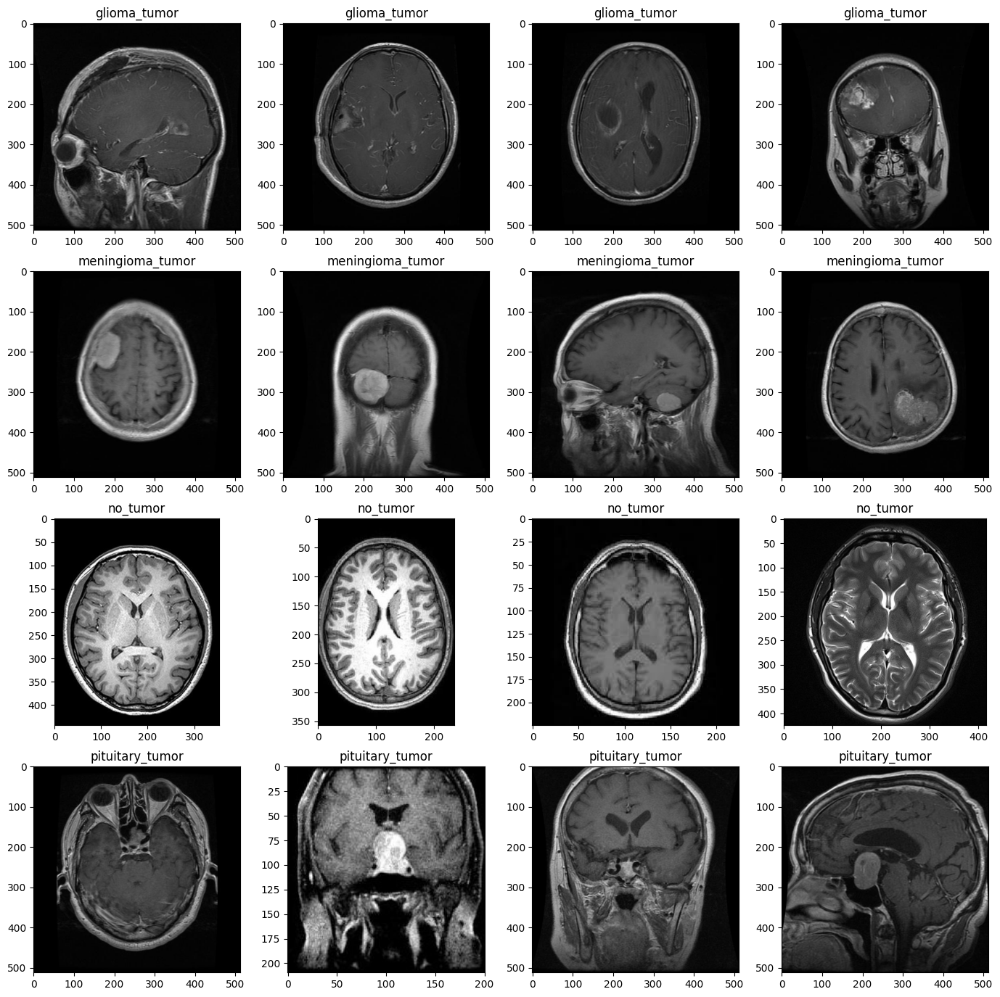

In [ ]:
plt.figure(figsize = (17,17))
index = 0
for c in classes:
  random.shuffle(files_path_dict[c])
  path_list = files_path_dict[c][:5]

  for i in range(1, 5):
    index += 1
    plt.subplot(4, 4, index)
    plt.imshow(load_img(path_list[i]))
    plt.title(c)

In [ ]:
#check the number of images in each class in the training dataset
No_images_per_class = []
Class_name = []

for i in os.listdir('/content/train_combined_data'):
  train_class = os.listdir(os.path.join('/content/train_combined_data', i))
  No_images_per_class.append(len(train_class))
  Class_name.append(i)
  print('Number of images in {} = {} \n'.format(i, len(train_class)))

Number of images in glioma_tumor = 740 

Number of images in meningioma_tumor = 749 

Number of images in no_tumor = 316 

Number of images in pituitary_tumor = 720 



In [ ]:
import plotly.express as px

# Assuming you have the lists No_images_per_class and Class_name
# generated from the code you provided

# Plot histogram using plotly express
classname2 = px.bar(x=Class_name, y=No_images_per_class,
                   title='Distribution of No_images_per_class',
                   labels={'x': 'Class Name', 'y': 'Number of Images'},
                   color_discrete_sequence=['darkturquoise'],
                   )
classname2.update_yaxes(showgrid=False)
classname2.update_xaxes(categoryorder='total descending')
classname2.update_traces(hovertemplate=None)
classname2.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=0,
                        xaxis_title='Class Name', yaxis_title="Number of Images",
                        plot_bgcolor='midnightblue', paper_bgcolor='midnightblue',
                        title_font=dict(size=25, color='white', family="Muli, sans-serif"),
                        font=dict(color='white'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )

# Show the plot
classname2.show()


## Create a Function to Crop Images

In [ ]:
def crop_image(image, plot=False):

    #convert to grayscale
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    #blur
    img_gray = cv2.GaussianBlur(img_gray, (5, 5), 0)

    #apply binary threshhold
    img_thresh = cv2.threshold(img_gray, 45, 255, cv2.THRESH_BINARY)[1]

    #apply erosion
    img_thresh = cv2.erode(img_thresh, None, iterations=2)

    #dilate images
    img_thresh = cv2.dilate(img_thresh, None, iterations=2)

    #find shapes or the contour of images
    contours = cv2.findContours(img_thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #grab contours
    contours = imutils.grab_contours(contours)

    #find biggest contour
    c = max(contours, key=cv2.contourArea)

    #extract contour positions
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])

    #generate new image
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]

    #plot
    if plot:
        plt.figure(figsize=(15, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.tick_params(axis='both', which='both', top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Original Image')
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)
        plt.tick_params(axis='both', which='both',top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Cropped Image')
        plt.show()

    return new_image


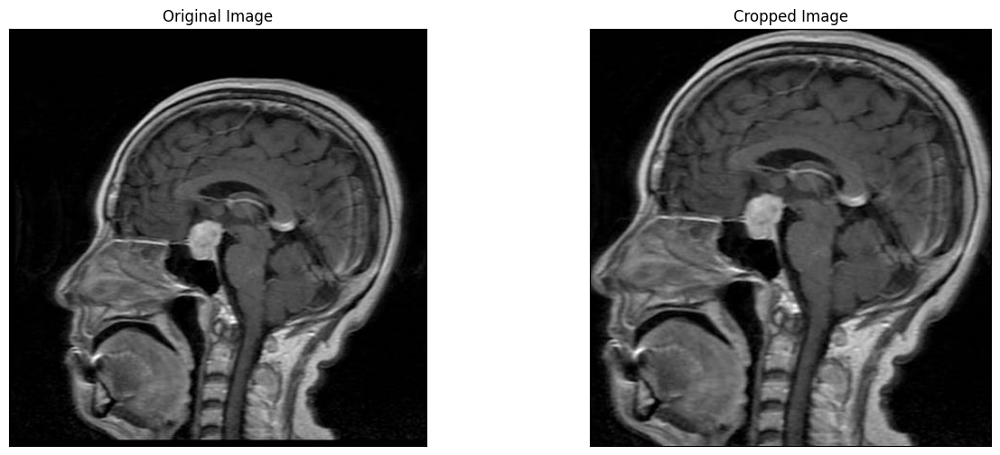

In [ ]:
example_image = cv2.imread('/content/train_combined_data/pituitary_tumor/pituitary_tumor_image(20).jpg')
cropped_image = crop_image(example_image, plot=True)

In [ ]:
#specify directory
train_dir = '/content/train_combined_data'
test_dir = '/content/test_combined_data'


## Saving The Cropped Images

In [ ]:
#crop training images and save it to the directory we previously created
glioma = train_dir + '/' + 'glioma_tumor'
meningioma = train_dir + '/' + 'meningioma_tumor'
pituitary = train_dir + '/' + 'pituitary_tumor'
no_tumor = train_dir + '/' + 'no_tumor'

j = 0
for i in tqdm(os.listdir(glioma)):
  path = os.path.join(glioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Crop-Brain-MRI/glioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(meningioma)):
  path = os.path.join(meningioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Crop-Brain-MRI/meningioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(pituitary)):
  path = os.path.join(pituitary, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Crop-Brain-MRI/pituitary_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(no_tumor)):
  path = os.path.join(no_tumor, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Crop-Brain-MRI/no_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

100%|██████████| 316/316 [00:01<00:00, 215.59it/s]


In [ ]:
#crop testing images and save it to the directory we previously created
test_glioma = test_dir + '/' + 'glioma_tumor'
test_meningioma = test_dir + '/' + 'meningioma_tumor'
test_pituitary = test_dir + '/' + 'pituitary_tumor'
test_no_tumor = test_dir + '/' + 'no_tumor'

j = 0
for i in tqdm(os.listdir(test_glioma)):
  path = os.path.join(test_glioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Test-Data/glioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(test_meningioma)):
  path = os.path.join(test_meningioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Test-Data/meningioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(test_pituitary)):
  path = os.path.join(test_pituitary, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Test-Data/pituitary_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(test_no_tumor)):
  path = os.path.join(test_no_tumor, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Test-Data/no_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1


100%|██████████| 80/80 [00:00<00:00, 207.60it/s]


## Data Augmentation

In [ ]:
#use Image Data Generator to perform this task
#train set
datagen = ImageDataGenerator(rotation_range=10,
                             height_shift_range=0.2,
                             horizontal_flip=True,
                             validation_split=0.2)

train_data = datagen.flow_from_directory('/content/Crop-Brain-MRI/',
                                         target_size=(240, 240),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='training')

valid_data = datagen.flow_from_directory('/content/Crop-Brain-MRI/',
                                         target_size=(240, 240),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='validation')

#test set
test_datagen = ImageDataGenerator()

test_data = datagen.flow_from_directory('/content/Test-Data/',
                                         target_size=(240, 240),
                                        class_mode='categorical',
                                        shuffle=False)


Found 2021 images belonging to 4 classes.
Found 504 images belonging to 4 classes.
Found 635 images belonging to 4 classes.


In [ ]:
#view the class dictionary
print(train_data.class_indices)
print(test_data.class_indices)

{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}


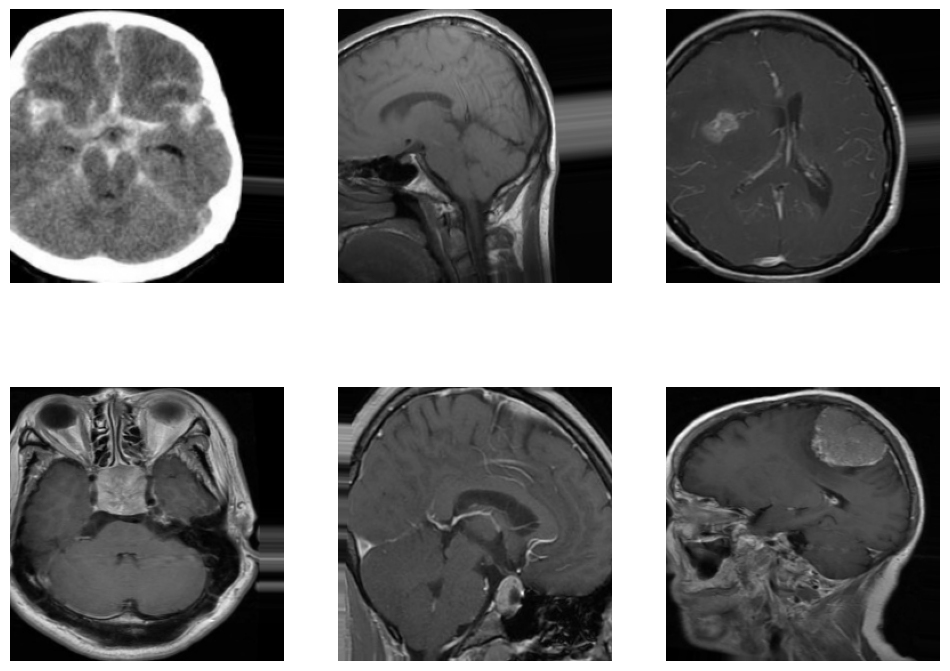

In [ ]:
#view the augmented data
sample_x, sample_y = next(train_data)
plt.figure(figsize=(12, 9))
for i in range(6):
  plt.subplot(2, 3, i+1)
  sample = array_to_img(sample_x[i])
  plt.axis('off')
  plt.grid(False)
  plt.imshow(sample)
plt.show()

## Model Architect

In [ ]:
#build the model
effnet = EfficientNetB1(weights='imagenet',
                        include_top=False,
                        input_shape=(240, 240, 3))

model = effnet.output
model = GlobalAveragePooling2D()(model)
model = Dropout(0.5)(model)
model = Dense(4, activation='softmax')(model)
model = Model(inputs=effnet.input,
              outputs=model)

#get summary()
model.summary()

27018416/27018416 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 240, 240, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 240, 240, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 240, 240, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)     

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.864086 to fit



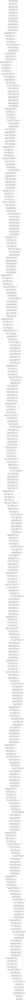

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## Compile Model

In [ ]:
#compile model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#define checkpoint
checkpoint = ModelCheckpoint('model.h5',
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='auto',
                             verbose=1)

#early stopping
earlystop = EarlyStopping(monitor='val_accuracy',
                          patience=5,
                          mode='auto',
                          verbose=1)

#reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy',
                              factor = 0.3,
                              patience = 2,
                              min_delta = 0.001,
                              mode='auto',
                              verbose=1)

## Model Training and Model Evaluation

In [ ]:
%%time

#train the model
history = model.fit(train_data,
                    epochs = 30,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr])

Epoch 1/30
64/64 [==============================] - ETA: 0s - loss: 0.9129 - accuracy: 0.6304
Epoch 1: val_accuracy improved from -inf to 0.76984, saving model to model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



64/64 [==============================] - 111s 818ms/step - loss: 0.9129 - accuracy: 0.6304 - val_loss: 0.6752 - val_accuracy: 0.7698 - lr: 1.0000e-04
Epoch 2/30
64/64 [==============================] - ETA: 0s - loss: 0.4367 - accuracy: 0.8446
Epoch 2: val_accuracy improved from 0.76984 to 0.82937, saving model to model.h5
64/64 [==============================] - 50s 788ms/step - loss: 0.4367 - accuracy: 0.8446 - val_loss: 0.4809 - val_accuracy: 0.8294 - lr: 1.0000e-04
Epoch 3/30
64/64 [==============================] - ETA: 0s - loss: 0.2579 - accuracy: 0.9174
Epoch 3: val_accuracy did not improve from 0.82937
64/64 [==============================] - 46s 712ms/step - loss: 0.2579 - accuracy: 0.9174 - val_loss: 0.5002 - val_accuracy: 0.8155 - lr: 1.0000e-04
Epoch 4/30
64/64 [==============================] - ETA: 0s - loss: 0.1894 - accuracy: 0.9391
Epoch 4: val_accuracy did not improve from 0.82937

Epoch 4: ReduceLROnPlateau reducing learning rate to 2.9999999242136255e-05.
64/64 [==

In [ ]:
%%time

#train the model
history = model.fit(train_data,
                    epochs = 30,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr])

Epoch 1/30
82/82 [==============================] - ETA: 0s - loss: 0.8548 - accuracy: 0.6651
Epoch 1: val_accuracy improved from -inf to 0.81442, saving model to model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


82/82 [==============================] - 126s 836ms/step - loss: 0.8548 - accuracy: 0.6651 - val_loss: 0.5872 - val_accuracy: 0.8144 - lr: 1.0000e-04
Epoch 2/30
82/82 [==============================] - ETA: 0s - loss: 0.3623 - accuracy: 0.8726
Epoch 2: val_accuracy improved from 0.81442 to 0.84202, saving model to model.h5
82/82 [==============================] - 61s 741ms/step - loss: 0.3623 - accuracy: 0.8726 - val_loss: 0.4005 - val_accuracy: 0.8420 - lr: 1.0000e-04
Epoch 3/30
82/82 [==============================] - ETA: 0s - loss: 0.2173 - accuracy: 0.9261
Epoch 3: val_accuracy improved from 0.84202 to 0.88497, saving model to model.h5
82/82 [==============================] - 63s 770ms/step - loss: 0.2173 - accuracy: 0.9261 - val_loss: 0.3308 - val_accuracy: 0.8850 - lr: 1.0000e-04
Epoch 4/30
82/82 [==============================] - ETA: 0s - loss: 0.1402 - accuracy: 0.9529
Epoch 4: val_accuracy improved from 0.88497 to 0.92945, saving model to model.h5
82/82 [====================

## Model Evaluation

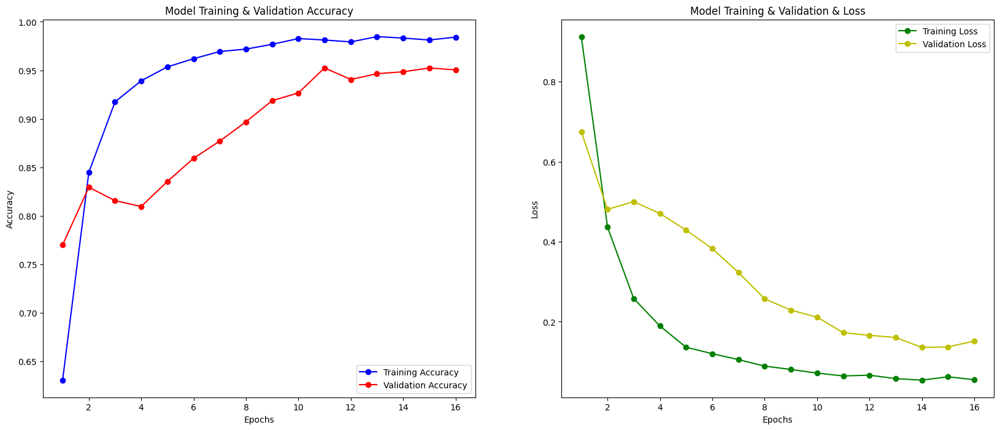

In [ ]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'b-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'r-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
print('Train accuracy & loss:', model.evaluate(train_data))
print('\n')
print('Test accuracy & loss:', model.evaluate(test_data))

64/64 [==============================] - 31s 477ms/step - loss: 0.0115 - accuracy: 0.9990
Train accuracy & loss: [0.011516496539115906, 0.9990103840827942]


20/20 [==============================] - 11s 575ms/step - loss: 0.1404 - accuracy: 0.9654
Test accuracy & loss: [0.14042112231254578, 0.965354323387146]


In [ ]:
#define labels for testing
y_test = test_data.classes

#make prediction
yhat_test = np.argmax(model.predict(test_data), axis=1)

20/20 [==============================] - 12s 491ms/step


In [ ]:
y_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
yhat_test

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion Matrix',
                          cmap = plt.cm.Blues):

    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    plt.grid(False)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 fontsize = 12,
                 horizontalalignment = "center",
                 color = "white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

[[178   6   2   0]
 [  6 179   0   3]
 [  2   3  74   1]
 [  1   1   0 179]]


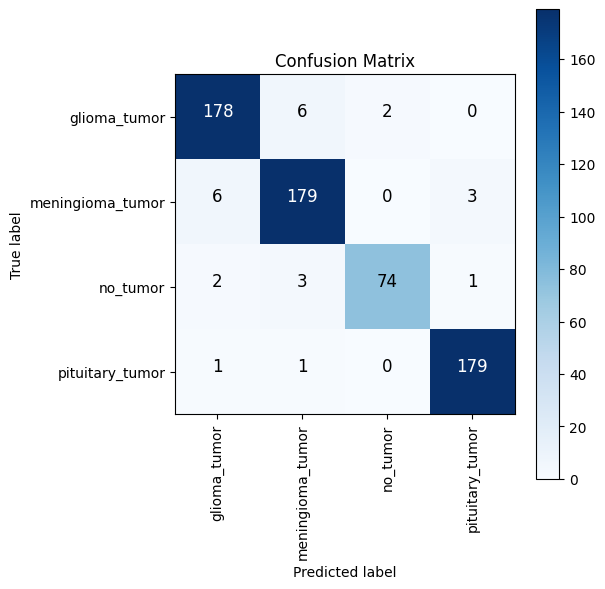

In [ ]:
#get confusion matrix
cm = confusion_matrix(y_test, yhat_test)
print(cm)

#plot
plot_confusion_matrix(cm, classes, normalize=False)

In [ ]:
#get classification report
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.95      0.96      0.95       186
           1       0.95      0.95      0.95       188
           2       0.97      0.93      0.95        80
           3       0.98      0.99      0.98       181

    accuracy                           0.96       635
   macro avg       0.96      0.96      0.96       635
weighted avg       0.96      0.96      0.96       635



In [ ]:
import plotly.graph_objects as go
report = classification_report(y_test, yhat_test, target_names=Class_name, output_dict=True)

# Extract precision and recall for each class
precision = [report[class_name]['precision'] for class_name in Class_name]
recall = [report[class_name]['recall'] for class_name in Class_name]
f1_score = [report[class_name]['f1-score'] for class_name in Class_name]
Accuracy = report['accuracy']

# Create a grouped bar plot for precision and recall
fig = go.Figure()

fig.add_trace(go.Bar(x=Class_name, y=precision, name='Precision', marker_color='darkcyan'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='Recall', marker_color='darkturquoise'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='f1_score', marker_color='red'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='Accuracy', marker_color='brown'))

fig.update_layout(barmode='group', title='Precision and Recall for Each Class',
                  xaxis_title='Class Name', yaxis_title='Score', showlegend=True)

fig.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=0,
                        xaxis_title='Class Name', yaxis_title="Number of Images",
                        plot_bgcolor='midnightblue', paper_bgcolor='midnightblue',
                        title_font=dict(size=25, color='white', family="Muli, sans-serif"),
                        font=dict(color='white'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )

fig.show()

## Obtaining Predictions on Test Images

In [ ]:
import PIL

class_dict = {0: 'glioma_tumor',
              1: 'meningioma_tumor',
              2: 'no_tumor',
              3: 'pituitary_tumor'}

prediction = []
original = []
image = []
count = 0
for i in os.listdir('/content/Test-Data/'):
  for item in os.listdir(os.path.join('/content/Test-Data', i)):
    # code to open the image
    img= PIL.Image.open(os.path.join('/content/Test-Data', i, item))
    #append to image list
    image.append(img)
    #expand dimension
    img = np.expand_dims(img, axis=0)
    #predict
    predict = model.predict(img)
    #get the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #append the predicted class to the list
    prediction.append(class_dict[predict])
    #append original class to the list
    original.append(i)

1/1 [==============================] - 0s 28ms/step


In [ ]:
prediction

['glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'no_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'no_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'gli

In [ ]:
#test accuracy
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.9511811023622048


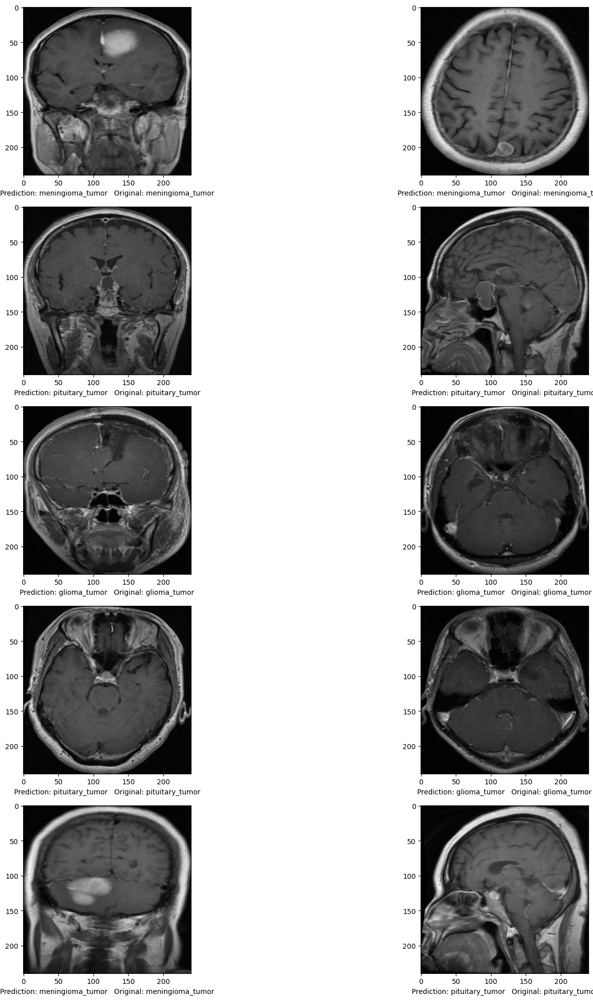

In [ ]:
#visualize the results
fig = plt.figure(figsize = (20, 20))
for i in range(10):
    j = random.randint(0, len(image)-1)
    fig.add_subplot(5, 2, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [ ]:
last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
last_conv_layer.name

'top_conv'

In [ ]:
#https://github.com/gkeechin/vizgradcam/blob/main/gradcam.py

def VizGradCAM(model, image, interpolant=0.5, plot_results=True):

    #sanity check
    assert (interpolant > 0 and interpolant < 1), "Heatmap Interpolation Must Be Between 0 - 1"

    #STEP 1: Preprocesss image and make prediction using our model
    #input image
    original_img = np.asarray(image, dtype = np.float32)
    #expamd dimension and get batch size
    img = np.expand_dims(original_img, axis=0)
    #predict
    prediction = model.predict(img)
    #prediction index
    prediction_idx = np.argmax(prediction)


    #STEP 2: Create new model
    #specify last convolutional layer
    last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
    target_layer = model.get_layer(last_conv_layer.name)

    #compute gradient of top predicted class
    with tf.GradientTape() as tape:
        #create a model with original model inputs and the last conv_layer as the output
        gradient_model = Model([model.inputs], [target_layer.output, model.output])
        #pass the image through the base model and get the feature map
        conv2d_out, prediction = gradient_model(img)
        #prediction loss
        loss = prediction[:, prediction_idx]

    #gradient() computes the gradient using operations recorded in context of this tape
    gradients = tape.gradient(loss, conv2d_out)

    #obtain the output from shape [1 x H x W x CHANNEL] -> [H x W x CHANNEL]
    output = conv2d_out[0]

    #obtain depthwise mean
    weights = tf.reduce_mean(gradients[0], axis=(0, 1))


    #create a 7x7 map for aggregation
    activation_map = np.zeros(output.shape[0:2], dtype=np.float32)
    #multiply weight for every layer
    for idx, weight in enumerate(weights):
        activation_map += weight * output[:, :, idx]
    #resize to image size
    activation_map = cv2.resize(activation_map.numpy(),
                                (original_img.shape[1],
                                 original_img.shape[0]))
    #ensure no negative number
    activation_map = np.maximum(activation_map, 0)
    #convert class activation map to 0 - 255
    activation_map = (activation_map - activation_map.min()) / (activation_map.max() - activation_map.min())
    #rescale and convert the type to int
    activation_map = np.uint8(255 * activation_map)


    #convert to heatmap
    heatmap = cv2.applyColorMap(activation_map, cv2.COLORMAP_JET)

    #superimpose heatmap onto image
    original_img = np.uint8((original_img - original_img.min()) / (original_img.max() - original_img.min()) * 255)
    cvt_heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    cvt_heatmap = img_to_array(cvt_heatmap)

    #enlarge plot
    plt.rcParams["figure.dpi"] = 100

    if plot_results == True:
        plt.imshow(np.uint8(original_img * interpolant + cvt_heatmap * (1 - interpolant)))
    else:
        return cvt_heatmap

1/1 [==============================] - 0s 276ms/step


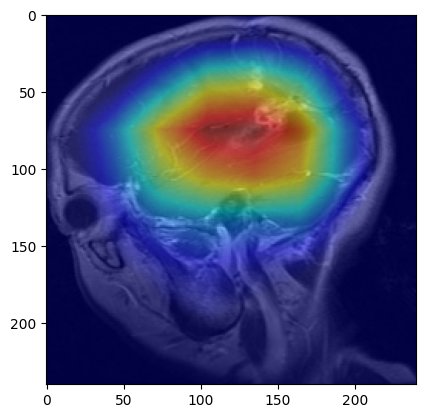

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/glioma_tumor/8.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 106ms/step


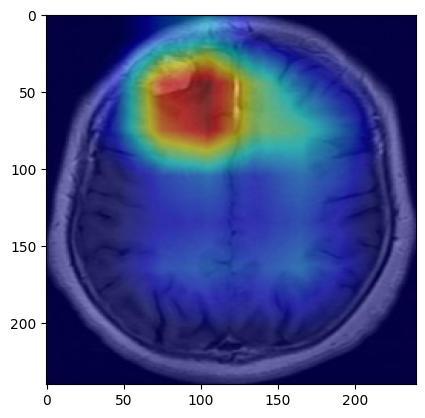

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/meningioma_tumor/0.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 52ms/step


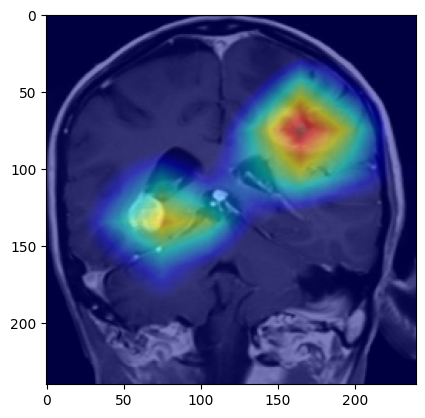

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/glioma_tumor/4.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 45ms/step


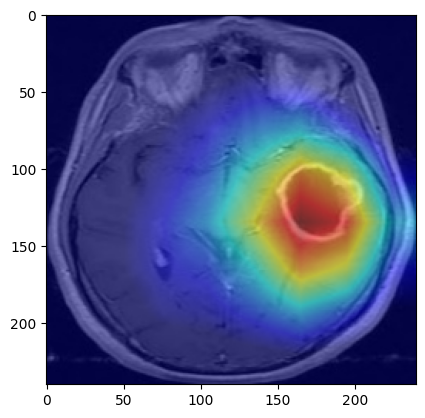

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/glioma_tumor/4.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 32ms/step


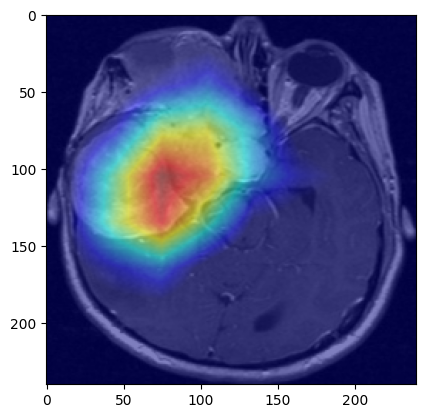

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/meningioma_tumor/0.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 99ms/step


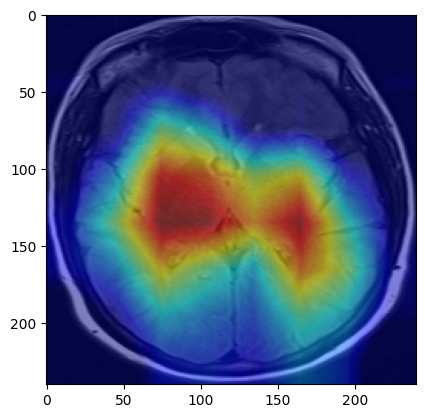

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/no_tumor/5.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 126ms/step


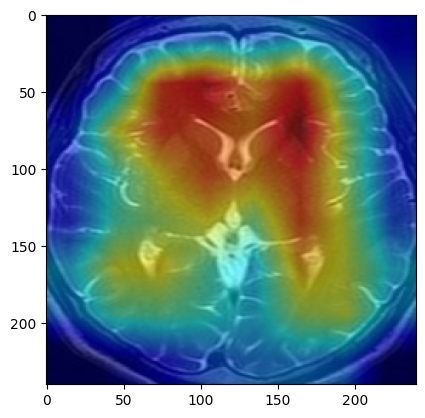

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/no_tumor/57.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 28ms/step


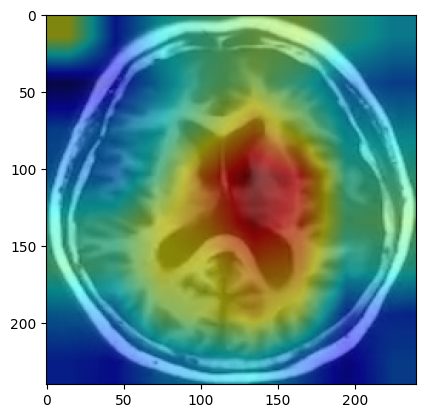

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/no_tumor/3.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 32ms/step


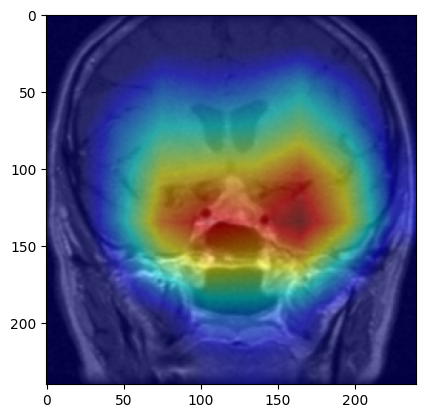

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/pituitary_tumor/4.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

## Softmax effnet

In [ ]:
effnet_svm = EfficientNetB1(weights='imagenet', include_top=False, input_shape=(240, 240, 3))

# Build the new layers
x = effnet_svm.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.345)(x)  # Add the first Dropout layer with a dropout ratio of 0.345
x = Dense(69, activation='relu')(x)  # Add the first Dense layer with 69 neurons and ReLU activation
x = Dropout(0.183)(x)  # Add the second Dropout layer with a dropout ratio of 0.183
x = Dense(69, activation='relu')(x)  # Add the second Dense layer with 69 neurons and ReLU activation

# For the classification layer, use Softmax for now
num_classes = 4  # Set the number of classes 
predictions = Dense(num_classes, activation='softmax')(x)  # Add the classification layer with Softmax activation

# Build the final model
model2 = Model(inputs=effnet_svm.input, outputs=predictions)
model2.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 240, 240, 3)]        0         []                            
                                                                                                  
 rescaling_2 (Rescaling)     (None, 240, 240, 3)          0         ['input_2[0][0]']             
                                                                                                  
 normalization_1 (Normaliza  (None, 240, 240, 3)          7         ['rescaling_2[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 240, 240, 3)          0         ['normalization_1[0][0]'

In [ ]:
model2.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
plot_loss_1 = PlotLossesCallback()
checkpoint = ModelCheckpoint('model2.h5', monitor='val_accuracy', save_best_only=True, mode='auto', verbose=1)
earlystop = EarlyStopping(monitor='val_accuracy', patience=5, mode='auto', verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.3, patience=2, min_delta=0.001, mode='auto', verbose=1)

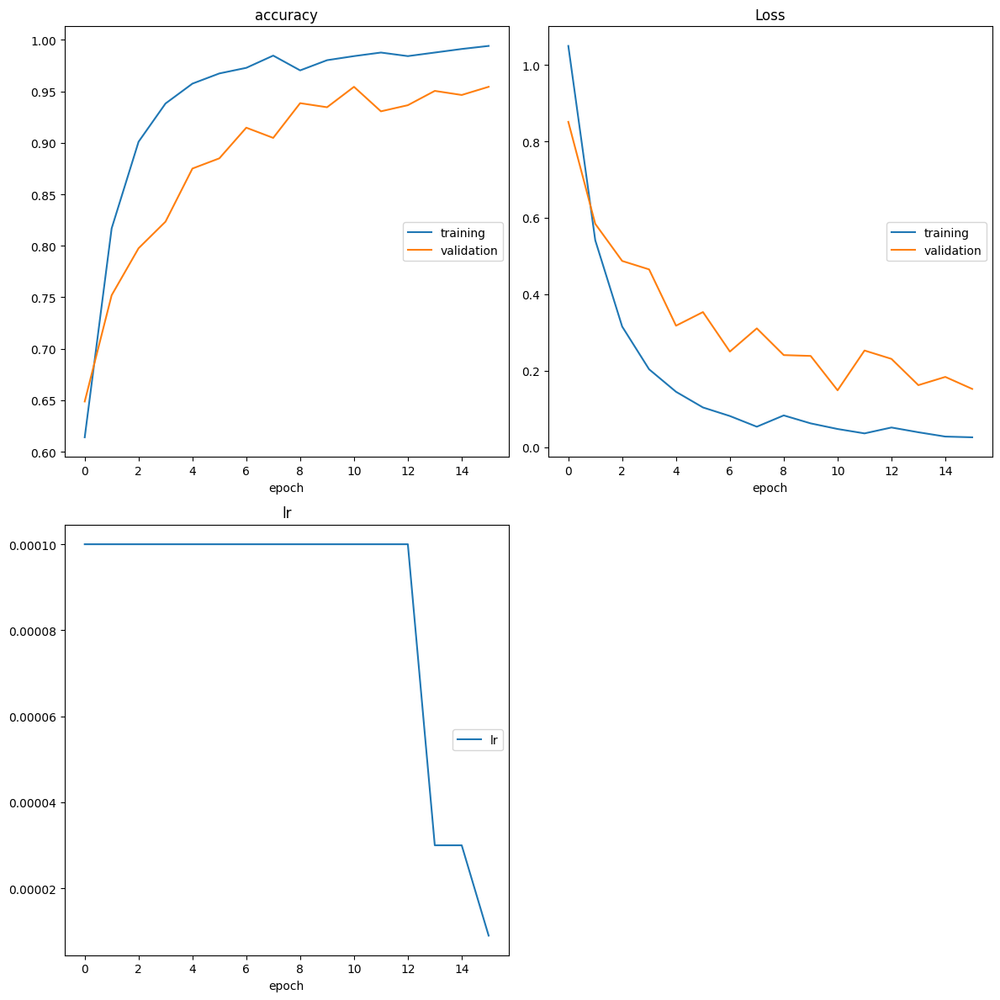

accuracy
	training         	 (min:    0.614, max:    0.994, cur:    0.994)
	validation       	 (min:    0.649, max:    0.954, cur:    0.954)
Loss
	training         	 (min:    0.026, max:    1.050, cur:    0.026)
	validation       	 (min:    0.149, max:    0.851, cur:    0.152)
lr
	lr               	 (min:    0.000, max:    0.000, cur:    0.000)
64/64 [==============================] - 48s 744ms/step - loss: 0.0256 - accuracy: 0.9941 - val_loss: 0.1522 - val_accuracy: 0.9544 - lr: 9.0000e-06
Epoch 16: early stopping


In [ ]:
plot_loss_2 = PlotLossesCallback()
history2 = model2.fit(train_data,
                    epochs=30,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr, plot_loss_2])

In [ ]:
plot_loss_2 = PlotLossesCallback()
history2 = model2.fit(train_data,
                    epochs=30,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr])

Epoch 1/30
82/82 [==============================] - ETA: 0s - loss: 1.0102 - accuracy: 0.6108
Epoch 1: val_accuracy improved from -inf to 0.71166, saving model to model2.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


82/82 [==============================] - 115s 819ms/step - loss: 1.0102 - accuracy: 0.6108 - val_loss: 0.7377 - val_accuracy: 0.7117 - lr: 1.0000e-04
Epoch 2/30
82/82 [==============================] - ETA: 0s - loss: 0.4203 - accuracy: 0.8641
Epoch 2: val_accuracy improved from 0.71166 to 0.82362, saving model to model2.h5
82/82 [==============================] - 62s 755ms/step - loss: 0.4203 - accuracy: 0.8641 - val_loss: 0.4216 - val_accuracy: 0.8236 - lr: 1.0000e-04
Epoch 3/30
82/82 [==============================] - ETA: 0s - loss: 0.2406 - accuracy: 0.9238
Epoch 3: val_accuracy improved from 0.82362 to 0.84049, saving model to model2.h5
82/82 [==============================] - 60s 735ms/step - loss: 0.2406 - accuracy: 0.9238 - val_loss: 0.3368 - val_accuracy: 0.8405 - lr: 1.0000e-04
Epoch 4/30
82/82 [==============================] - ETA: 0s - loss: 0.1660 - accuracy: 0.9453
Epoch 4: val_accuracy improved from 0.84049 to 0.85890, saving model to model2.h5
82/82 [=================

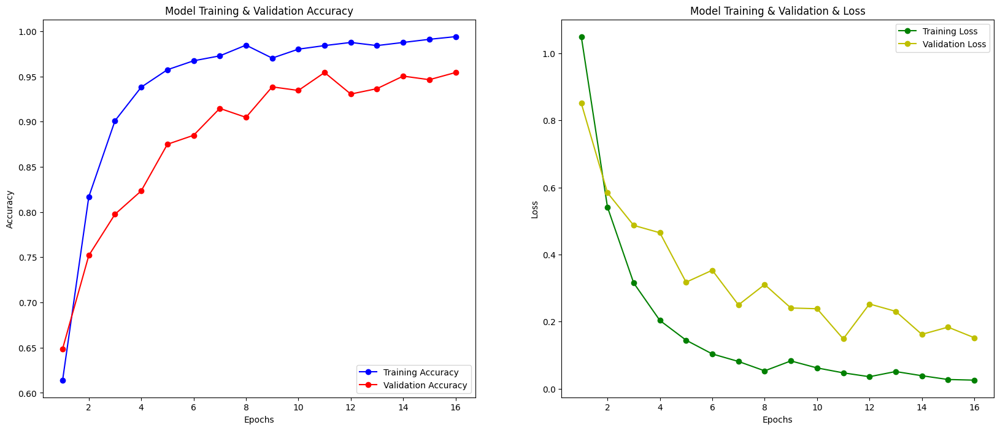

In [ ]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history2.history['accuracy']
train_loss = history2.history['loss']
val_acc = history2.history['val_accuracy']
val_loss = history2.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'b-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'r-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
print('Train accuracy & loss:', model2.evaluate(train_data))
print('\n')
print('Test accuracy & loss:', model2.evaluate(test_data))

64/64 [==============================] - 30s 464ms/step - loss: 0.0039 - accuracy: 0.9985
Train accuracy & loss: [0.0039174435660243034, 0.9985156059265137]


20/20 [==============================] - 10s 477ms/step - loss: 0.1486 - accuracy: 0.9622
Test accuracy & loss: [0.14859788119792938, 0.9622046947479248]


In [ ]:
#define labels for testing
y_test = test_data.classes

#make prediction
yhat_test = np.argmax(model2.predict(test_data), axis=1)

20/20 [==============================] - 12s 502ms/step


[[179   5   2   0]
 [  4 181   0   3]
 [  2   1  77   0]
 [  2   1   0 178]]


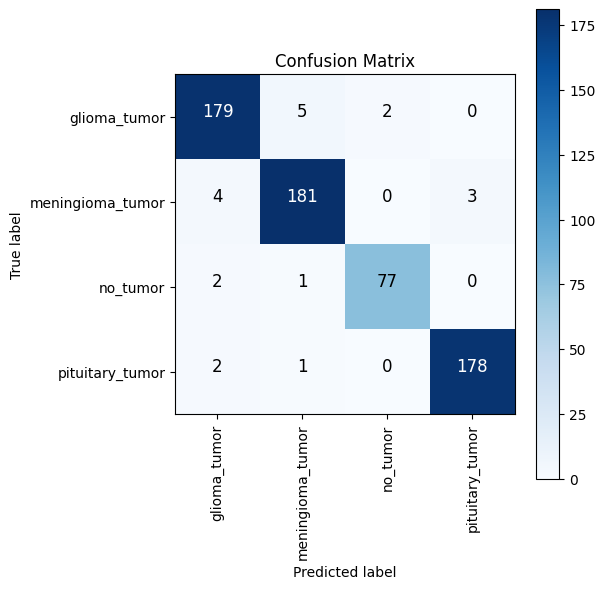

In [ ]:
#get confusion matrix
cm = confusion_matrix(y_test, yhat_test)
print(cm)

#plot
plot_confusion_matrix(cm, classes, normalize=False)

In [ ]:
#get classification report
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       186
           1       0.96      0.96      0.96       188
           2       0.97      0.96      0.97        80
           3       0.98      0.98      0.98       181

    accuracy                           0.97       635
   macro avg       0.97      0.97      0.97       635
weighted avg       0.97      0.97      0.97       635



In [ ]:
import plotly.graph_objects as go
report = classification_report(y_test, yhat_test, target_names=Class_name, output_dict=True)

# Extract precision and recall for each class
precision = [report[class_name]['precision'] for class_name in Class_name]
recall = [report[class_name]['recall'] for class_name in Class_name]
f1_score = [report[class_name]['f1-score'] for class_name in Class_name]
Accuracy = report['accuracy']

# Create a grouped bar plot for precision and recall
fig = go.Figure()

fig.add_trace(go.Bar(x=Class_name, y=precision, name='Precision', marker_color='darkcyan'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='Recall', marker_color='darkturquoise'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='f1_score', marker_color='red'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='Accuracy', marker_color='brown'))

fig.update_layout(barmode='group', title='Precision and Recall for Each Class',
                  xaxis_title='Class Name', yaxis_title='Score', showlegend=True)

fig.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=0,
                        xaxis_title='Class Name', yaxis_title="Number of Images",
                        plot_bgcolor='midnightblue', paper_bgcolor='midnightblue',
                        title_font=dict(size=25, color='white', family="Muli, sans-serif"),
                        font=dict(color='white'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )

fig.show()

In [ ]:
import PIL

class_dict = {0: 'glioma_tumor',
              1: 'meningioma_tumor',
              2: 'no_tumor',
              3: 'pituitary_tumor'}

prediction = []
original = []
image = []
count = 0
for i in os.listdir('/content/Test-Data/'):
  for item in os.listdir(os.path.join('/content/Test-Data', i)):
    # code to open the image
    img= PIL.Image.open(os.path.join('/content/Test-Data', i, item))
    #append to image list
    image.append(img)
    #expand dimension
    img = np.expand_dims(img, axis=0)
    #predict
    predict = model2.predict(img)
    #get the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #append the predicted class to the list
    prediction.append(class_dict[predict])
    #append original class to the list
    original.append(i)

1/1 [==============================] - 0s 28ms/step


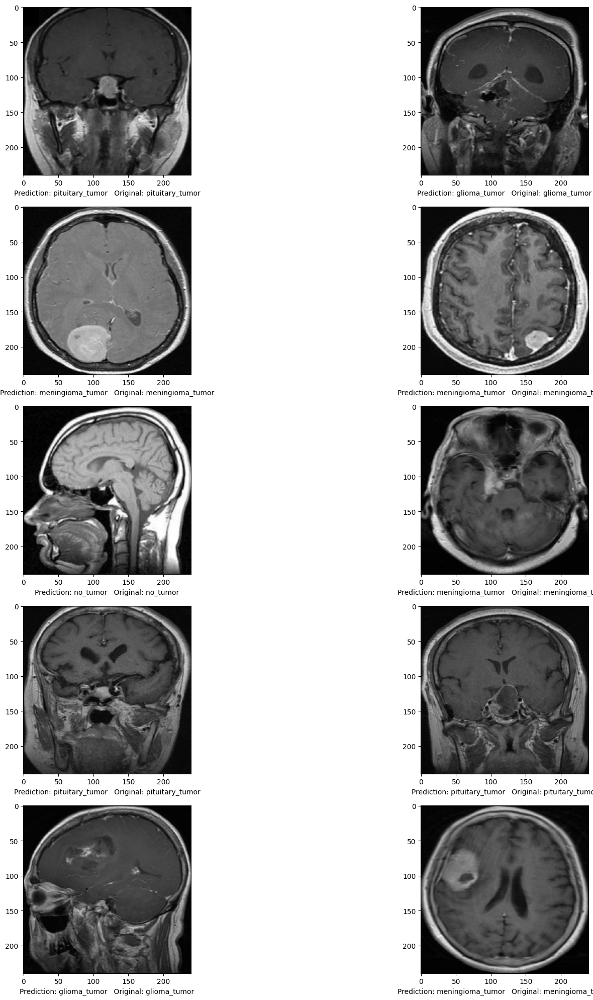

In [ ]:
#visualize the results
fig = plt.figure(figsize = (20, 20))
for i in range(10):
    j = random.randint(0, len(image)-1)
    fig.add_subplot(5, 2, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [ ]:
last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
last_conv_layer.name

'top_conv'

1/1 [==============================] - 4s 4s/step


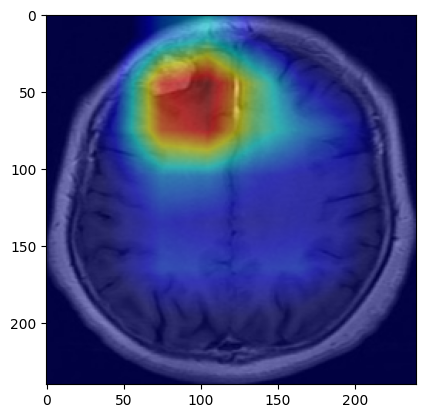

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/meningioma_tumor/0.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 4s 4s/step


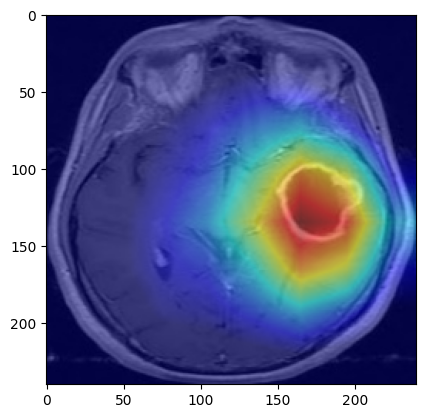

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/glioma_tumor/4.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 31ms/step


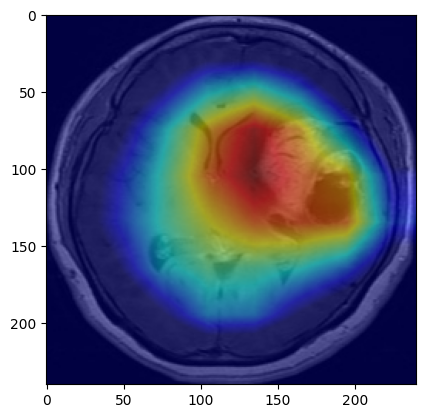

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/meningioma_tumor/102.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 146ms/step


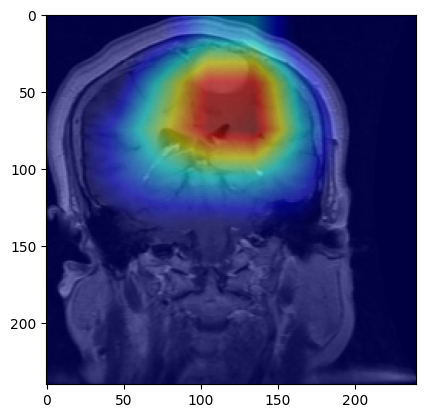

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/meningioma_tumor/109.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 100ms/step


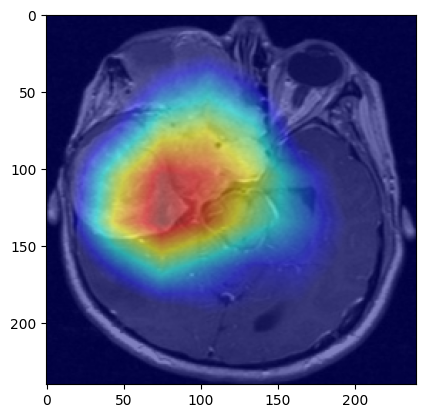

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/meningioma_tumor/0.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 64ms/step


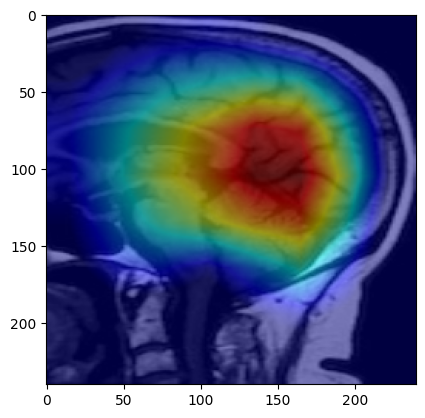

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/no_tumor/2.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 52ms/step


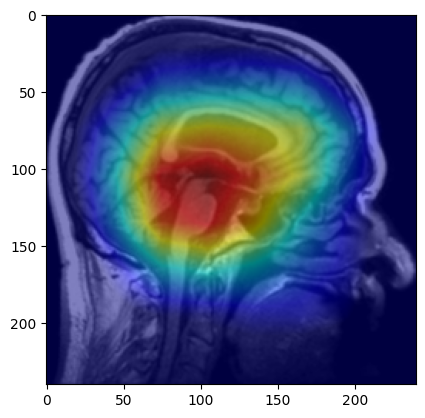

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/no_tumor/14.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 96ms/step


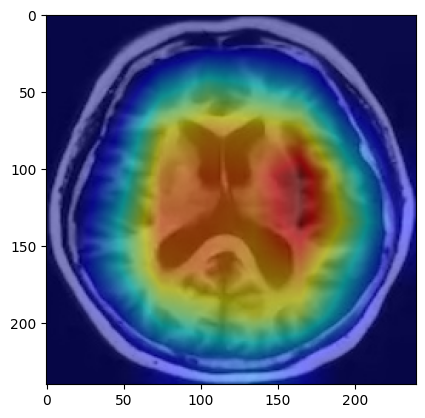

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/no_tumor/3.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 29ms/step


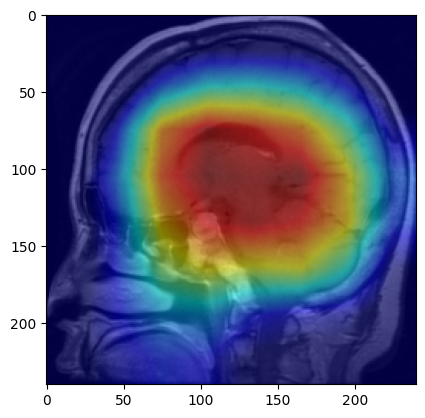

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/pituitary_tumor/104.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 101ms/step


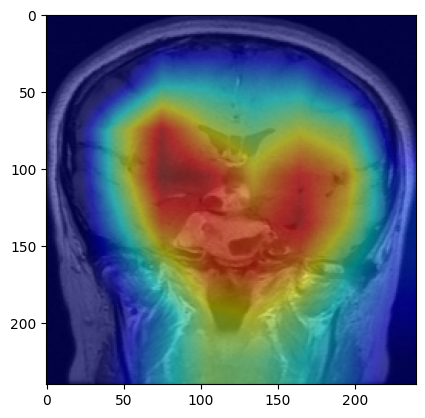

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/pituitary_tumor/106.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 181ms/step


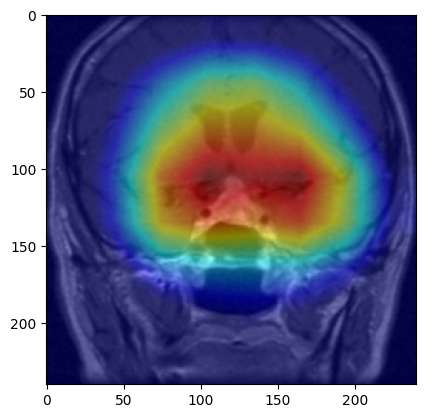

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/pituitary_tumor/4.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)

1/1 [==============================] - 0s 54ms/step


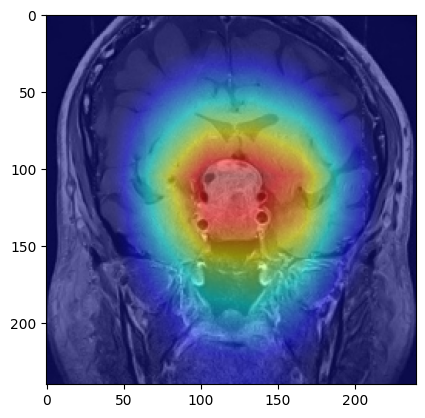

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/pituitary_tumor/0.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)